In [1]:
import os
import librosa
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [19]:
def extract_features(file_path):
    try:
        y, sr = librosa.load(file_path, sr=None)  
        tempo, _ = librosa.beat.beat_track(y=y, sr=sr) 
        mfcc = librosa.feature.mfcc(y=y, sr=sr)
        zcr = np.mean(librosa.feature.zero_crossing_rate(y=y))
        spectral_centroid = np.mean(librosa.feature.spectral_centroid(y=y, sr=sr))
        spectral_bandwidth = np.mean(librosa.feature.spectral_bandwidth(y=y, sr=sr))
        spectral_rolloff = np.mean(librosa.feature.spectral_rolloff(y=y, sr=sr))
        chroma_stft = np.mean(librosa.feature.chroma_stft(y=y, sr=sr), axis=1)
        
        features = {
            'length': len(y) / sr,
            'tempo': tempo,
            'mean_mfcc': np.mean(mfcc, axis=1),
            'std_mfcc': np.std(mfcc, axis=1),
            'zcr': zcr,
            'spectral_centroid': spectral_centroid,
            'spectral_bandwidth': spectral_bandwidth,
            'spectral_rolloff': spectral_rolloff,
            'chroma_stft': chroma_stft
        }
        return features
    except Exception as e:
        print(f"Error processing {file_path}: {e}")
        return None

In [20]:
data_dir = ''

In [21]:
genres = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']

In [22]:
data = []
for genre in genres:
    genre_path = os.path.join(data_dir, genre)
    for file_name in os.listdir(genre_path):
        if file_name.endswith('.wav'):
            file_path = os.path.join(genre_path, file_name)
            features = extract_features(file_path)
            if features:
                features['genre'] = genre
                data.append(features)

df = pd.DataFrame(data)

C:\Users\james\AppData\Local\Temp\ipykernel_17444\3481392825.py:4: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=None)  # Загрузка аудиофайла с исходной частотой дискретизации
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\librosa\core\audio.py:183: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Error processing C:\Users\james\Desktop\2й семестр\НИР\Data\genres_original\jazz\jazz.00054.wav: 


In [25]:
mfcc_columns = [f'mfcc_{i}' for i in range(20)]
chroma_columns = [f'chroma_{i}' for i in range(12)]

In [26]:
mfcc_df = pd.DataFrame(df['mean_mfcc'].tolist(), columns=mfcc_columns)
chroma_df = pd.DataFrame(df['chroma_stft'].tolist(), columns=chroma_columns)

features_df = df[['length', 'tempo', 'zcr', 'spectral_centroid', 'spectral_bandwidth', 'spectral_rolloff']].copy()
features_df = pd.concat([features_df, mfcc_df, chroma_df], axis=1)
features_df['genre'] = df['genre']

print(features_df.head())

      length       tempo       zcr  spectral_centroid  spectral_bandwidth  \
0  30.013333  123.046875  0.083045        1784.122641         2002.412407   
1  30.013333   67.999589  0.056040        1530.261767         2038.987608   
2  30.013333  161.499023  0.076291        1552.832481         1747.754087   
3  30.013333   63.024009  0.033309        1070.153418         1596.422564   
4  30.013333  135.999178  0.101461        1835.128513         1748.410758   

   spectral_rolloff      mfcc_0      mfcc_1     mfcc_2     mfcc_3  ...  \
0       3805.723030 -113.598824  121.570671 -19.162262  42.363941  ...   
1       3550.713616 -207.523834  123.985138   8.947020  35.867149  ...   
2       3042.410115  -90.757164  140.440872 -29.084547  31.686693  ...   
3       2184.879029 -199.575134  150.086105   5.663404  26.855278  ...   
4       3579.957471 -160.354172  126.209496 -35.581394  22.139256  ...   

   chroma_3  chroma_4  chroma_5  chroma_6  chroma_7  chroma_8  chroma_9  \
0  0.244692  0.24

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


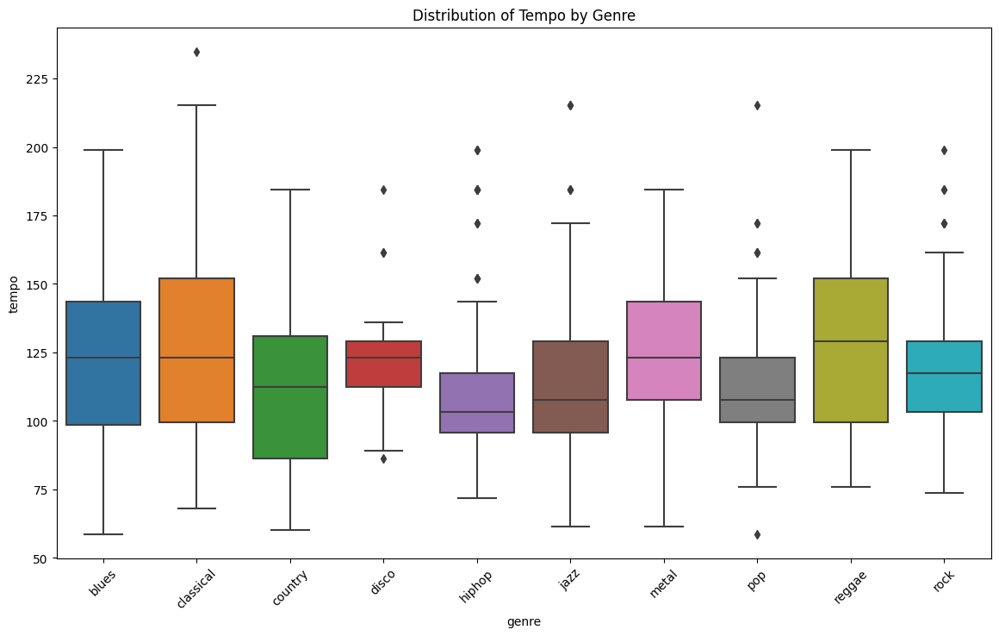

In [38]:
plt.figure(figsize=(14, 8))
sns.boxplot(x='genre', y='tempo', data=features_df)
plt.title('Distribution of Tempo by Genre')
plt.xticks(rotation=45)
plt.show()

In [29]:
mfcc_mean_by_genre = mfcc_df.copy()
mfcc_mean_by_genre['genre'] = df['genre']
mfcc_mean_by_genre = mfcc_mean_by_genre.groupby('genre').mean().T

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

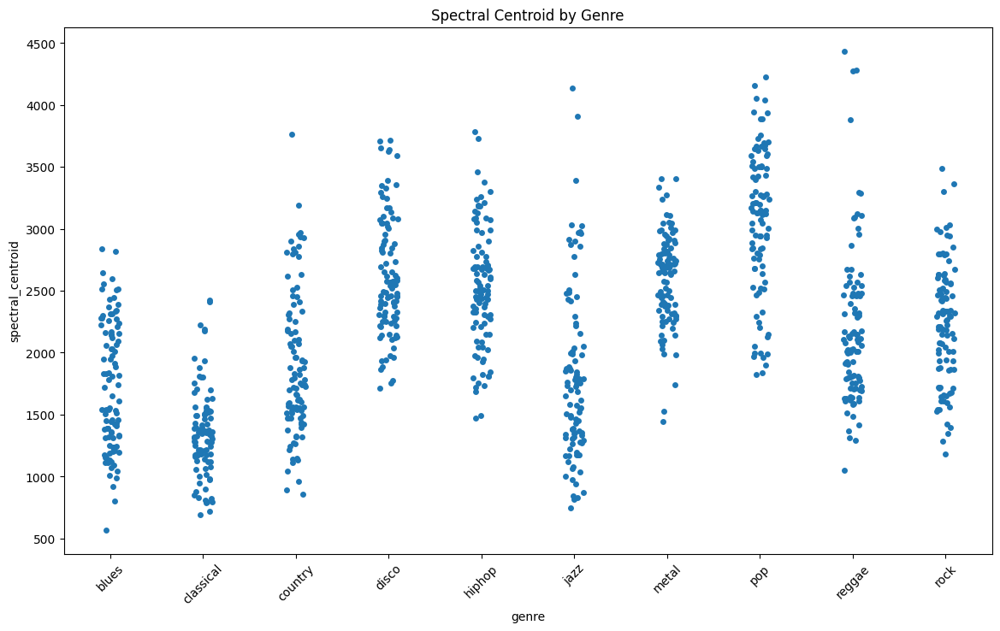

In [40]:
plt.figure(figsize=(14, 8))
sns.stripplot(x='genre', y='spectral_centroid', data=features_df, jitter=True)
plt.title('Spectral Centroid by Genre')
plt.xticks(rotation=45)
plt.show()

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

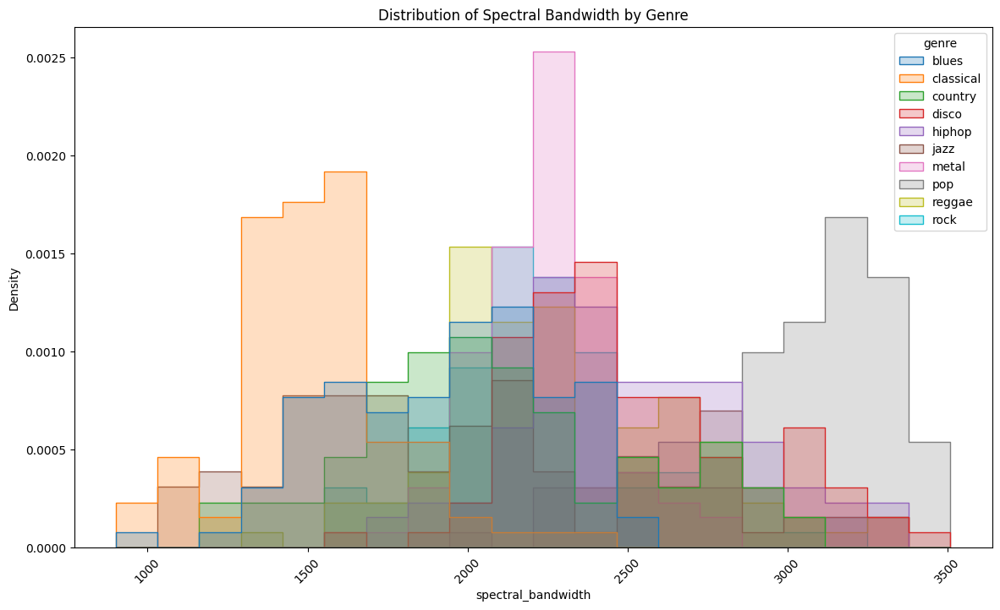

In [41]:
plt.figure(figsize=(14, 8))
sns.histplot(data=features_df, x='spectral_bandwidth', hue='genre', element='step', stat='density', common_norm=False)
plt.title('Distribution of Spectral Bandwidth by Genre')
plt.xticks(rotation=45)
plt.show()

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

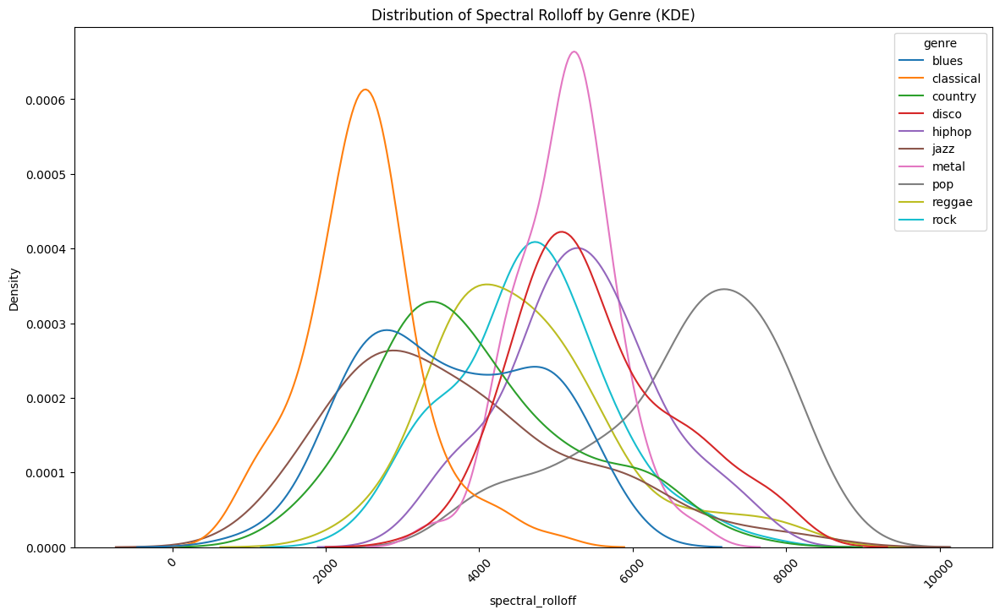

In [42]:
plt.figure(figsize=(14, 8))
sns.kdeplot(data=features_df, x='spectral_rolloff', hue='genre', common_norm=False)
plt.title('Distribution of Spectral Rolloff by Genre (KDE)')
plt.xticks(rotation=45)
plt.show()

C:\Users\james\AppData\Local\Temp\ipykernel_17444\3701682138.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=features_df, x='genre', y='zcr', ci=None)
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(d

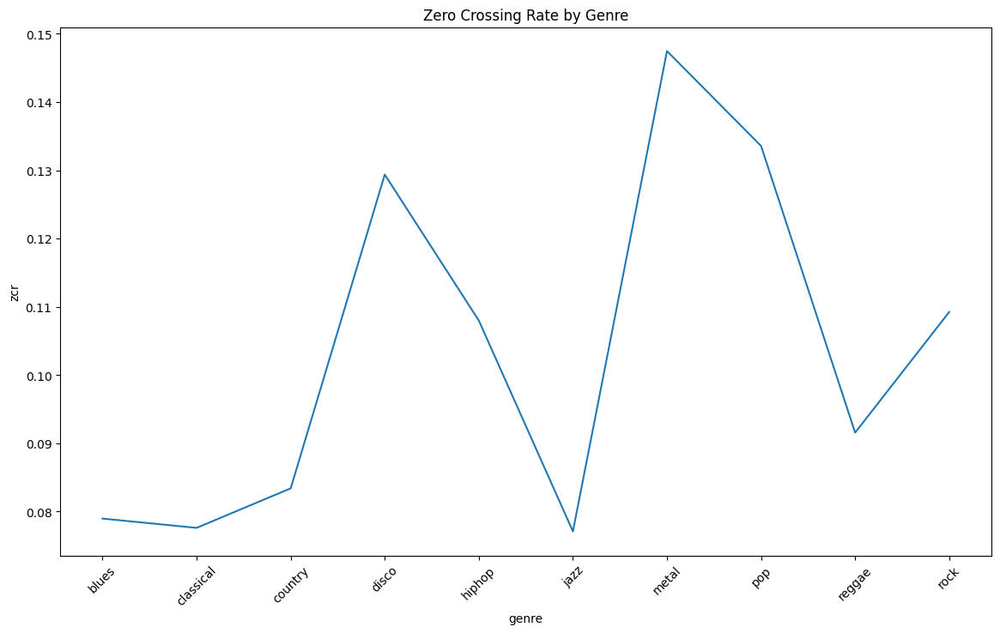

In [43]:
plt.figure(figsize=(14, 8))
sns.lineplot(data=features_df, x='genre', y='zcr', ci=None)
plt.title('Zero Crossing Rate by Genre')
plt.xticks(rotation=45)
plt.show()

In [44]:
mfcc_mean_by_genre = mfcc_df.copy()
mfcc_mean_by_genre['genre'] = df['genre']
mfcc_mean_by_genre = mfcc_mean_by_genre.groupby('genre').mean().T

In [46]:
chroma_mean_by_genre = chroma_df.copy()
chroma_mean_by_genre['genre'] = df['genre']
chroma_mean_by_genre = chroma_mean_by_genre.groupby('genre').mean().T

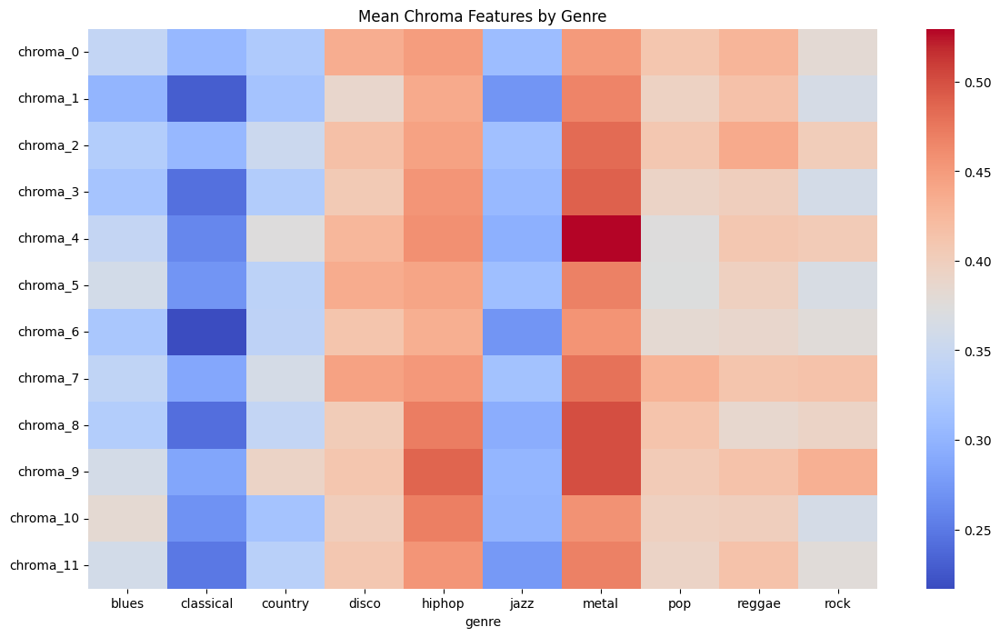

In [47]:
plt.figure(figsize=(14, 8))
sns.heatmap(chroma_mean_by_genre, cmap='coolwarm')
plt.title('Mean Chroma Features by Genre')
plt.show()

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

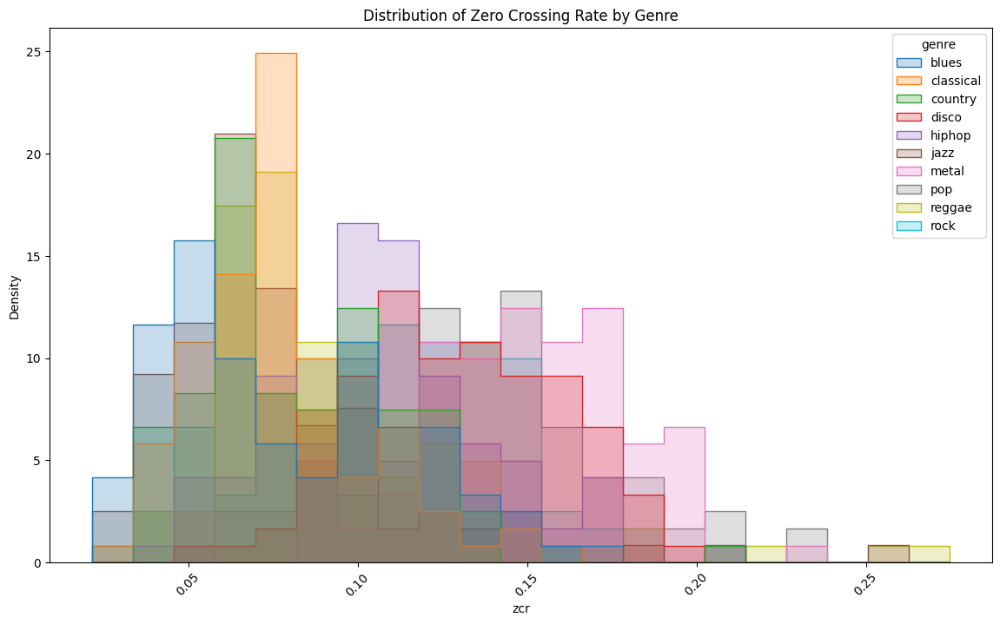

In [48]:
plt.figure(figsize=(14, 8))
sns.histplot(data=features_df, x='zcr', hue='genre', element='step', stat='density', common_norm=False)
plt.title('Distribution of Zero Crossing Rate by Genre')
plt.xticks(rotation=45)
plt.show()

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

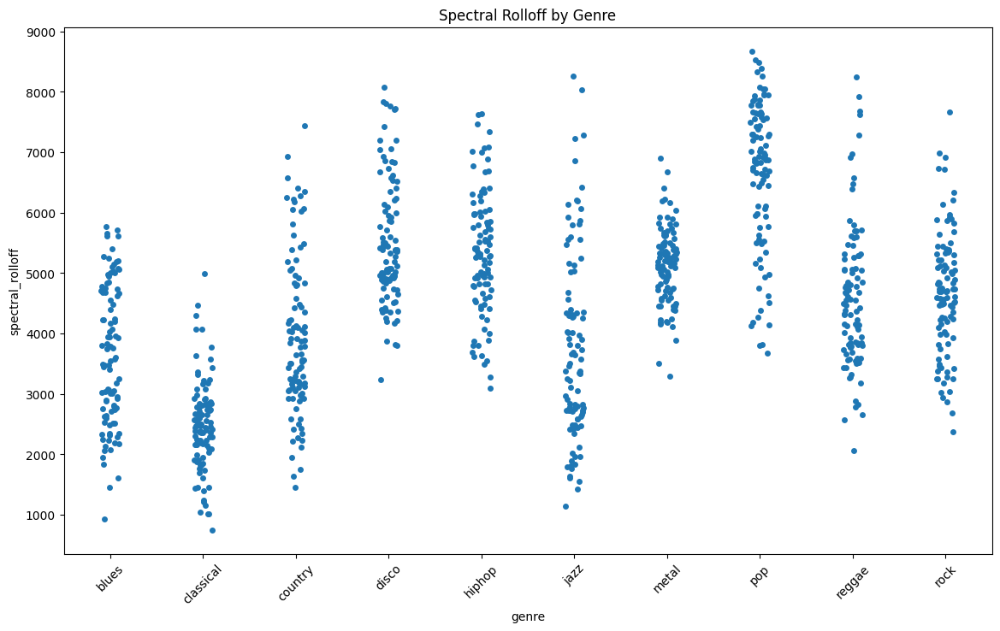

In [49]:
plt.figure(figsize=(14, 8))
sns.stripplot(x='genre', y='spectral_rolloff', data=features_df, jitter=True)
plt.title('Spectral Rolloff by Genre')
plt.xticks(rotation=45)
plt.show()

C:\Users\james\AppData\Local\Temp\ipykernel_17444\1383991956.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=features_df, x='genre', y='spectral_bandwidth', ci=None)
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. U

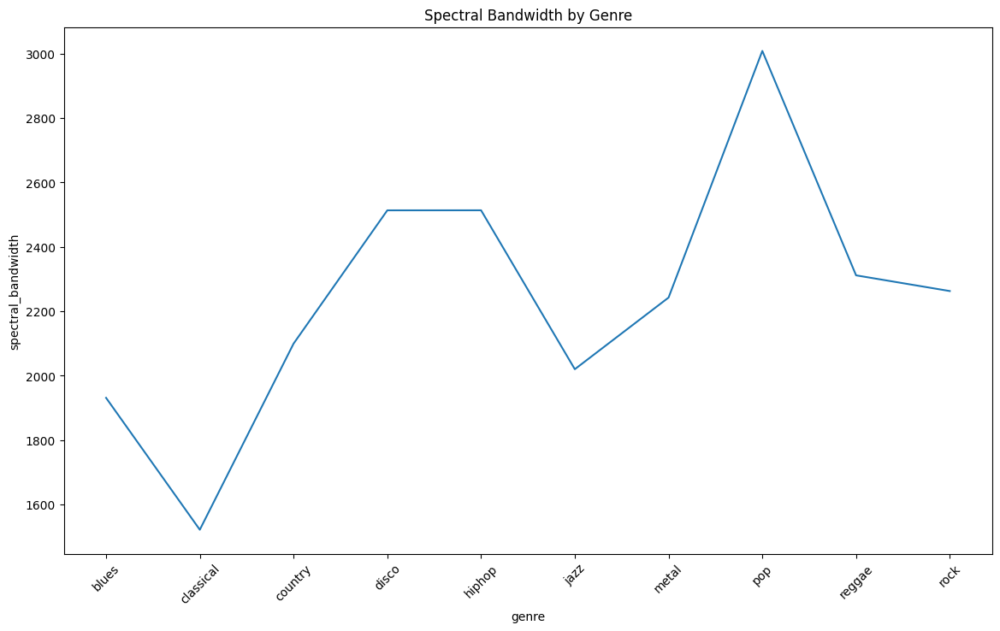

In [51]:
plt.figure(figsize=(14, 8))
sns.lineplot(data=features_df, x='genre', y='spectral_bandwidth', ci=None)
plt.title('Spectral Bandwidth by Genre')
plt.xticks(rotation=45)
plt.show()

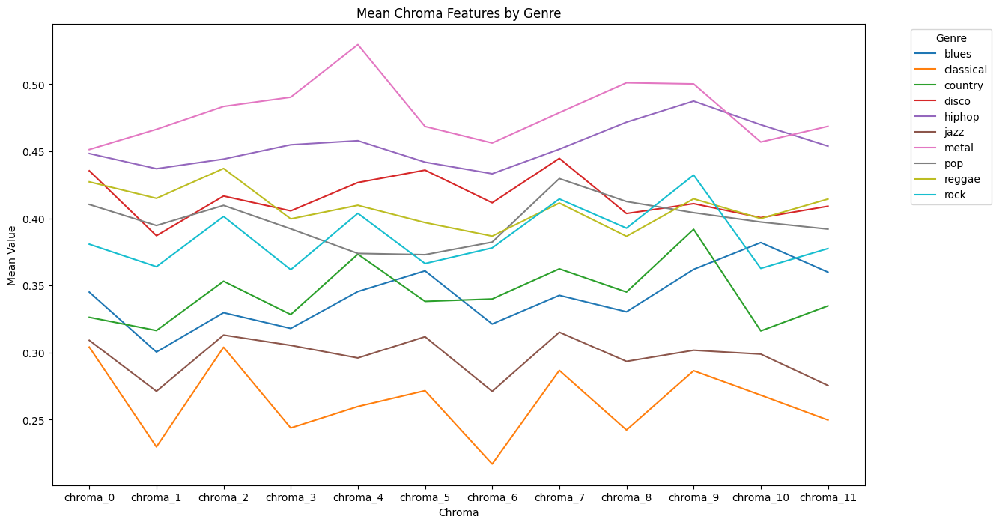

In [52]:
chroma_mean_by_genre = chroma_df.copy()
chroma_mean_by_genre['genre'] = df['genre']
chroma_mean_by_genre = chroma_mean_by_genre.groupby('genre').mean().T

plt.figure(figsize=(14, 8))
for chroma in chroma_mean_by_genre.columns:
    plt.plot(chroma_mean_by_genre.index, chroma_mean_by_genre[chroma], label=chroma)
plt.title('Mean Chroma Features by Genre')
plt.xlabel('Chroma')
plt.ylabel('Mean Value')
plt.legend(title='Genre', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

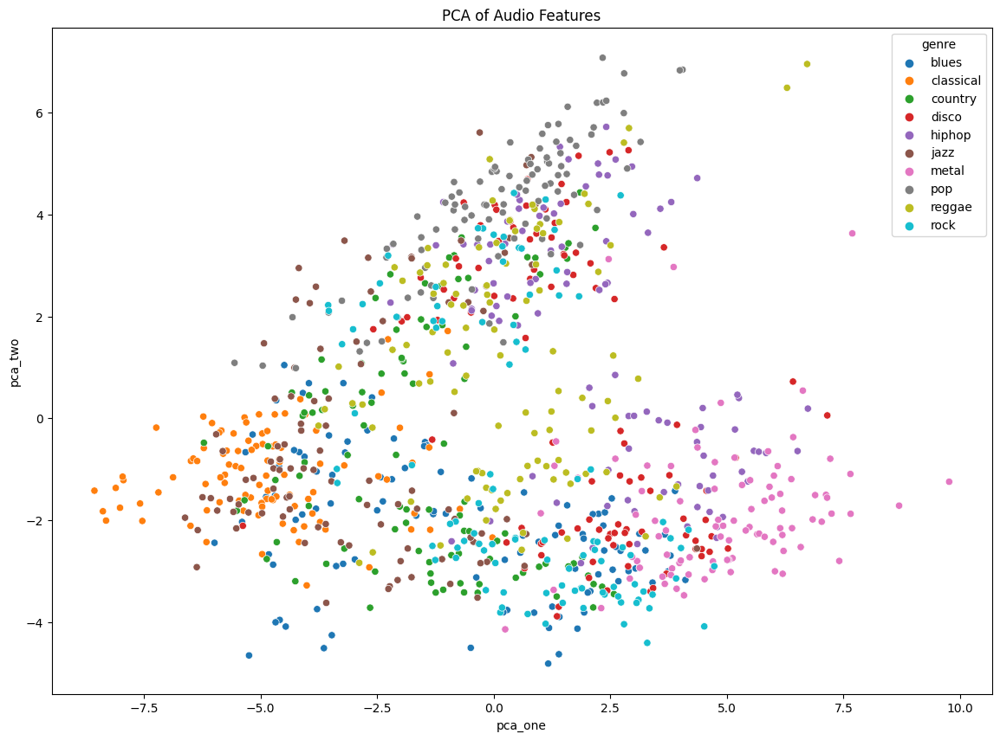

In [54]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
features_scaled = scaler.fit_transform(features_df.drop(columns=['genre']))

pca = PCA(n_components=2)
pca_result = pca.fit_transform(features_scaled)
features_df['pca_one'] = pca_result[:, 0]
features_df['pca_two'] = pca_result[:, 1]

plt.figure(figsize=(14, 10))
sns.scatterplot(x='pca_one', y='pca_two', hue='genre', data=features_df, palette='tab10')
plt.title('PCA of Audio Features')
plt.show()

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

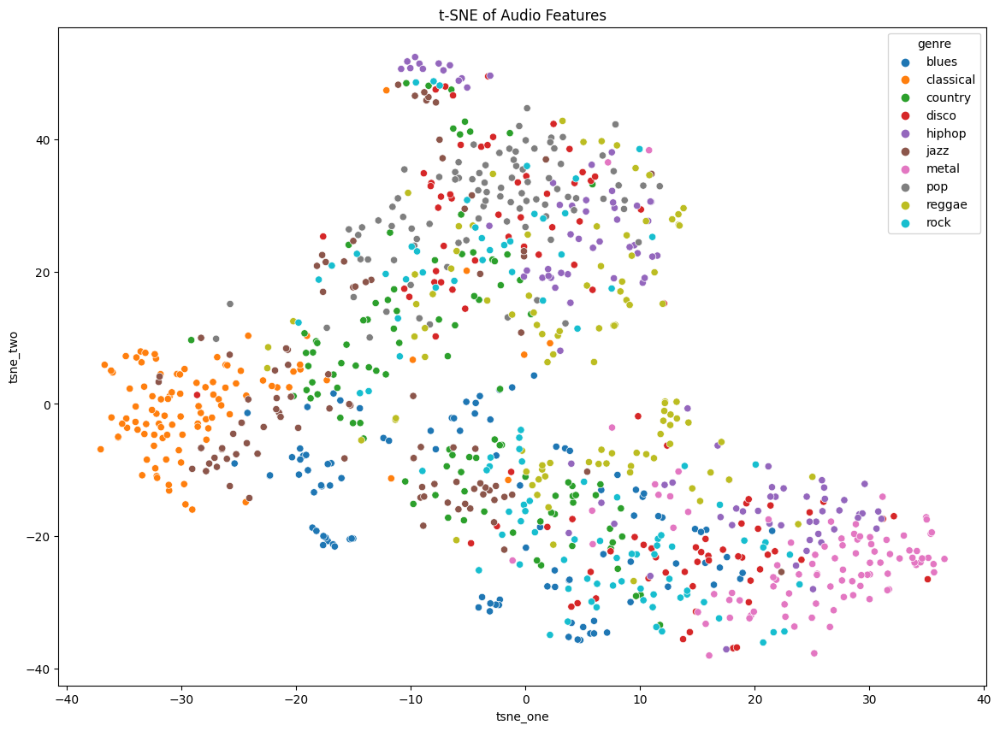

In [55]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(features_scaled)
features_df['tsne_one'] = tsne_result[:, 0]
features_df['tsne_two'] = tsne_result[:, 1]

plt.figure(figsize=(14, 10))
sns.scatterplot(x='tsne_one', y='tsne_two', hue='genre', data=features_df, palette='tab10')
plt.title('t-SNE of Audio Features')
plt.show()

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_catego

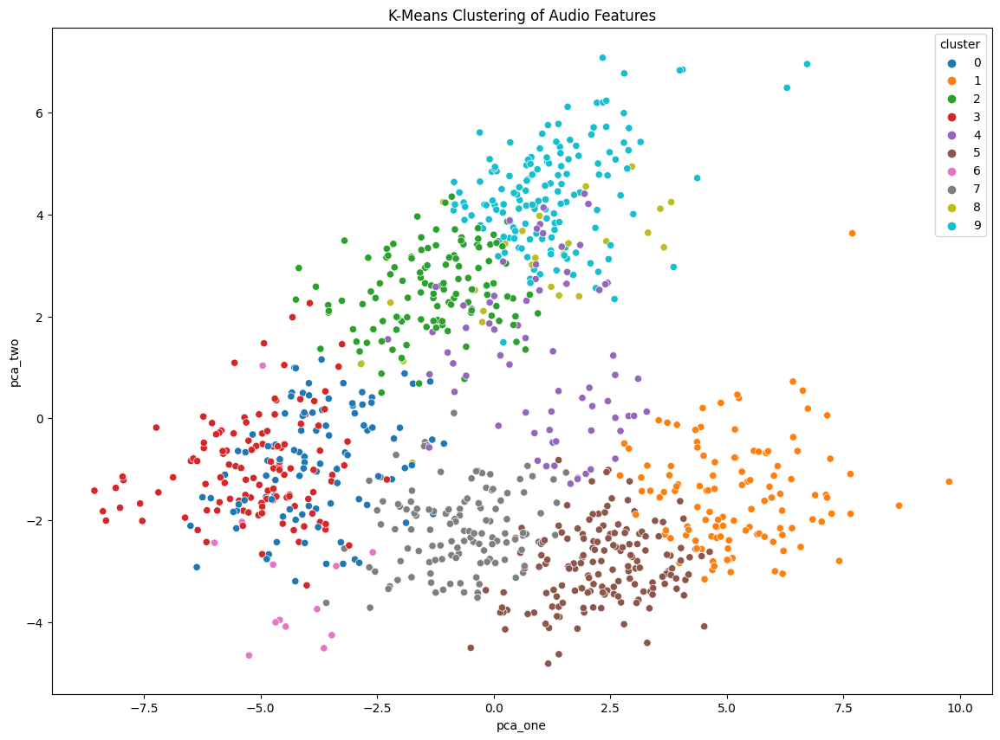

In [56]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=10, random_state=42)
features_df['cluster'] = kmeans.fit_predict(features_scaled)

plt.figure(figsize=(14, 10))
sns.scatterplot(x='pca_one', y='pca_two', hue='cluster', data=features_df, palette='tab10')
plt.title('K-Means Clustering of Audio Features')
plt.show()

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

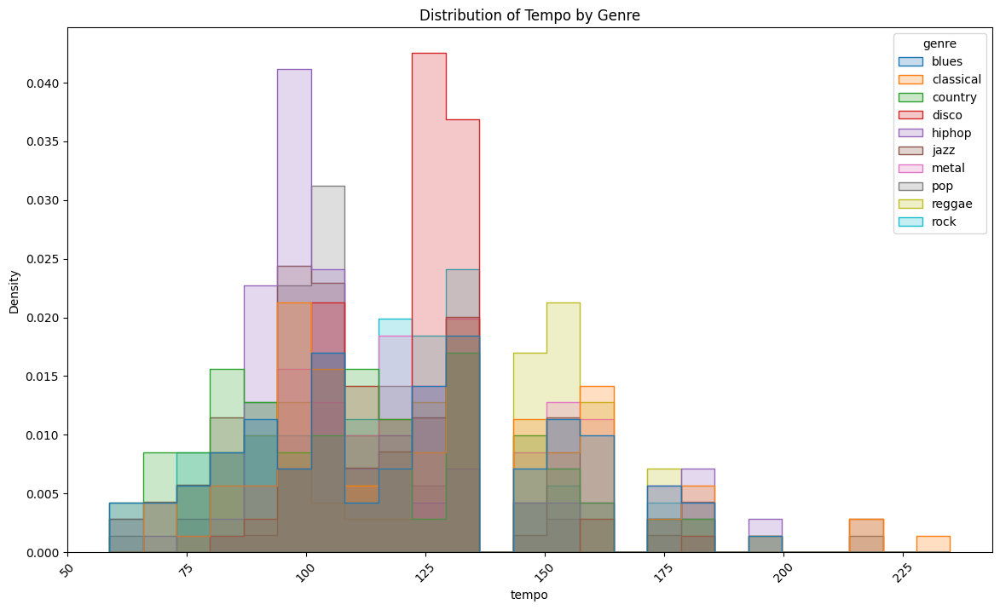

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

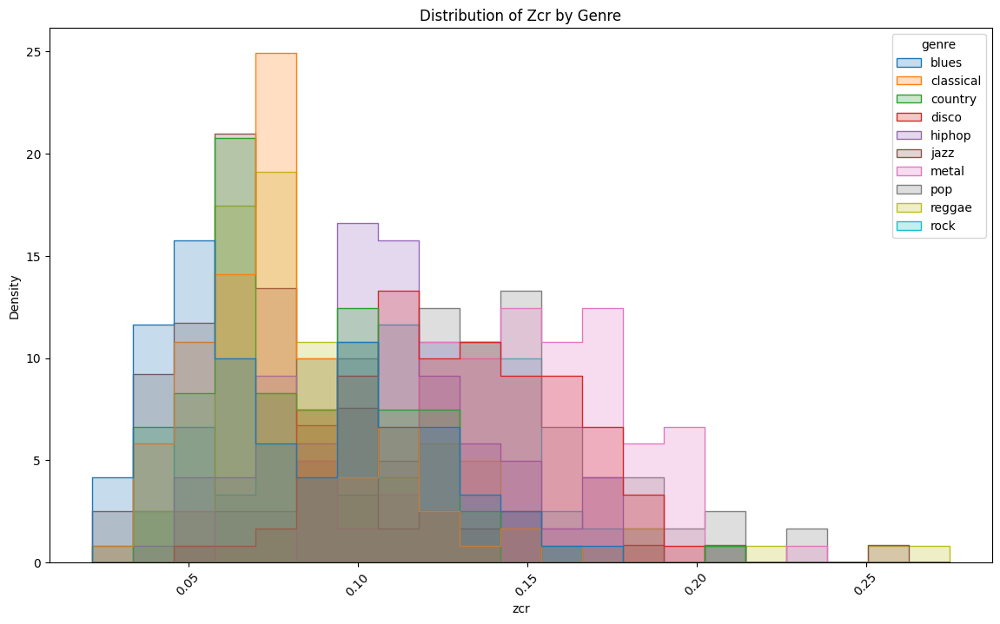

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

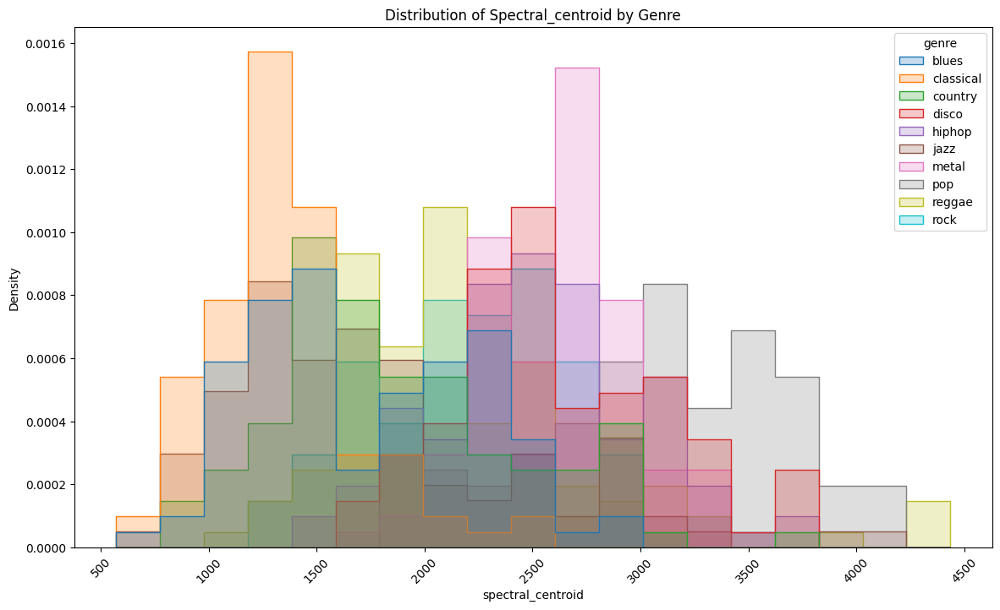

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

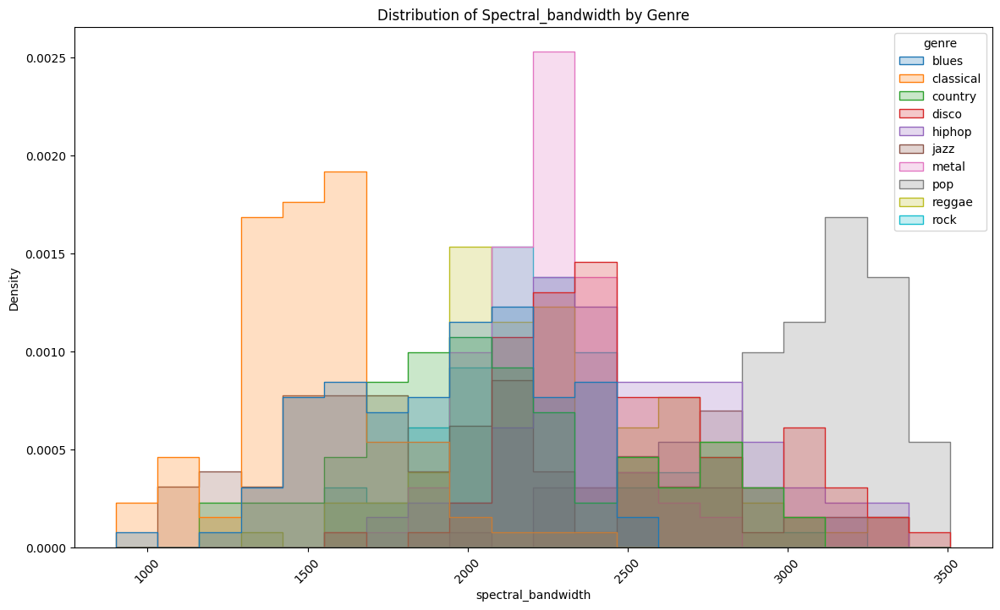

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

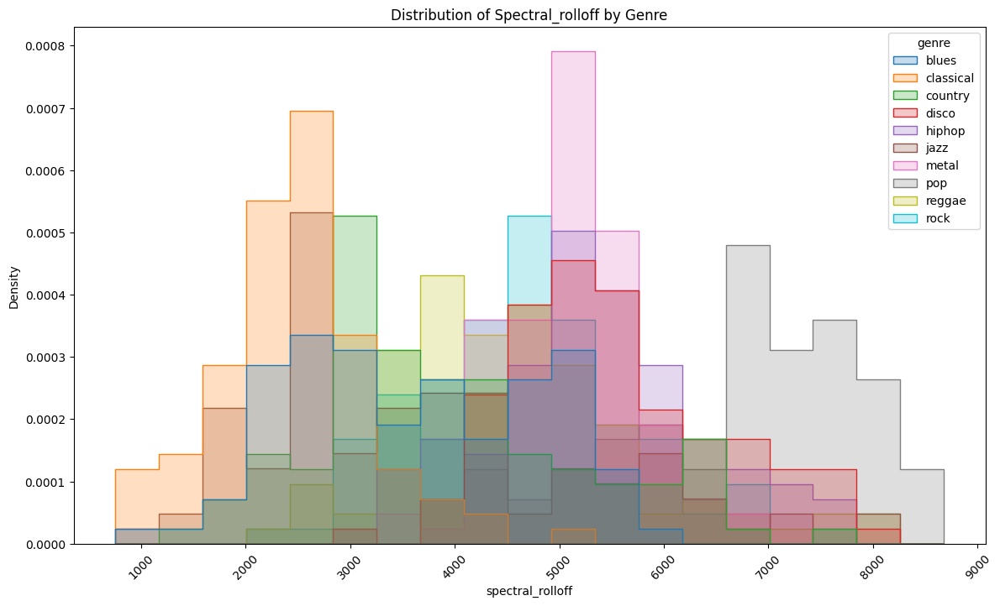

In [57]:
for feature in ['tempo', 'zcr', 'spectral_centroid', 'spectral_bandwidth', 'spectral_rolloff']:
    plt.figure(figsize=(14, 8))
    sns.histplot(data=features_df, x=feature, hue='genre', element='step', stat='density', common_norm=False)
    plt.title(f'Distribution of {feature.capitalize()} by Genre')
    plt.xticks(rotation=45)
    plt.show()

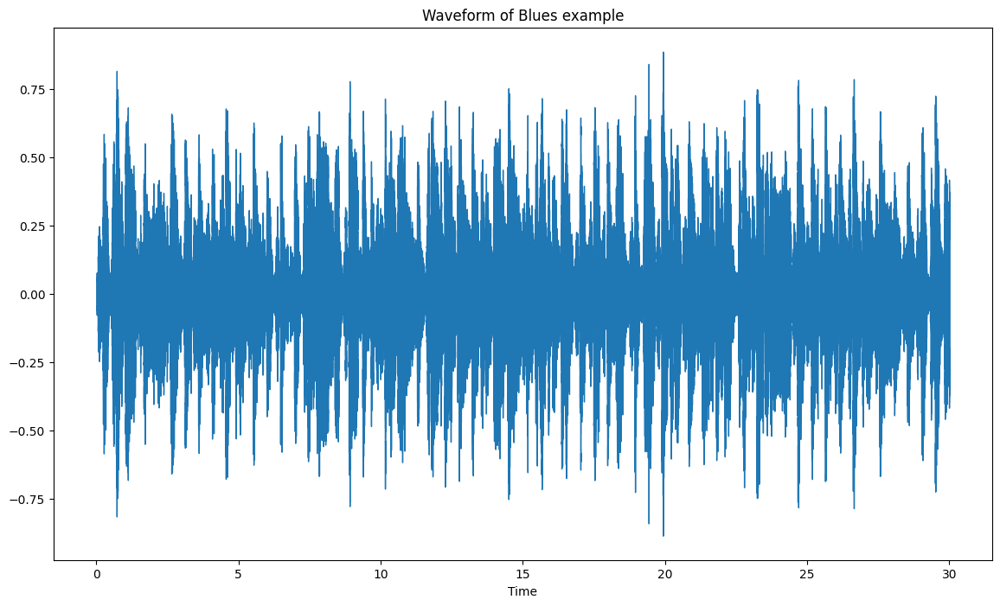

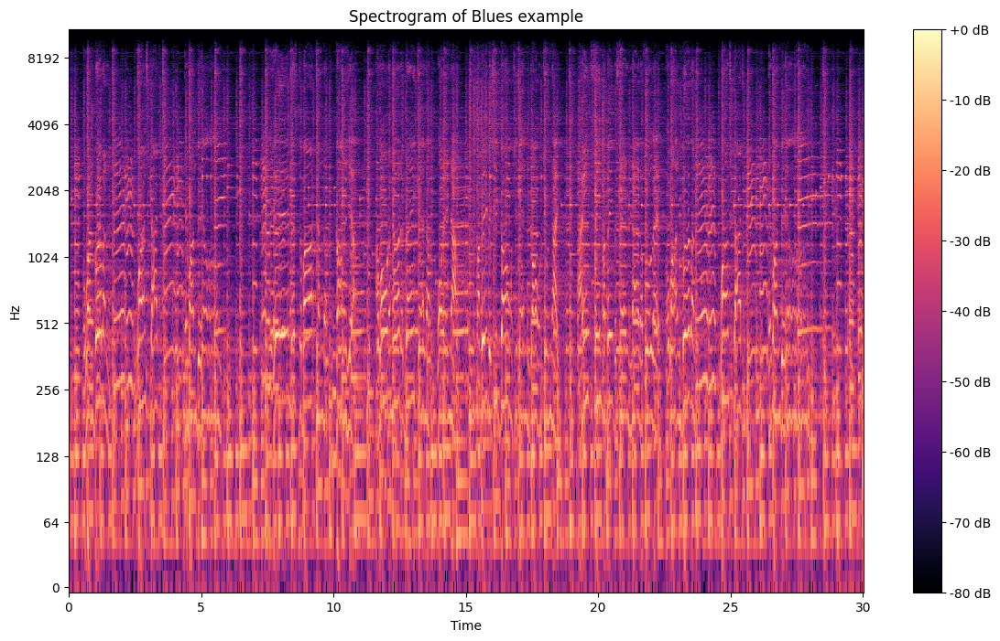

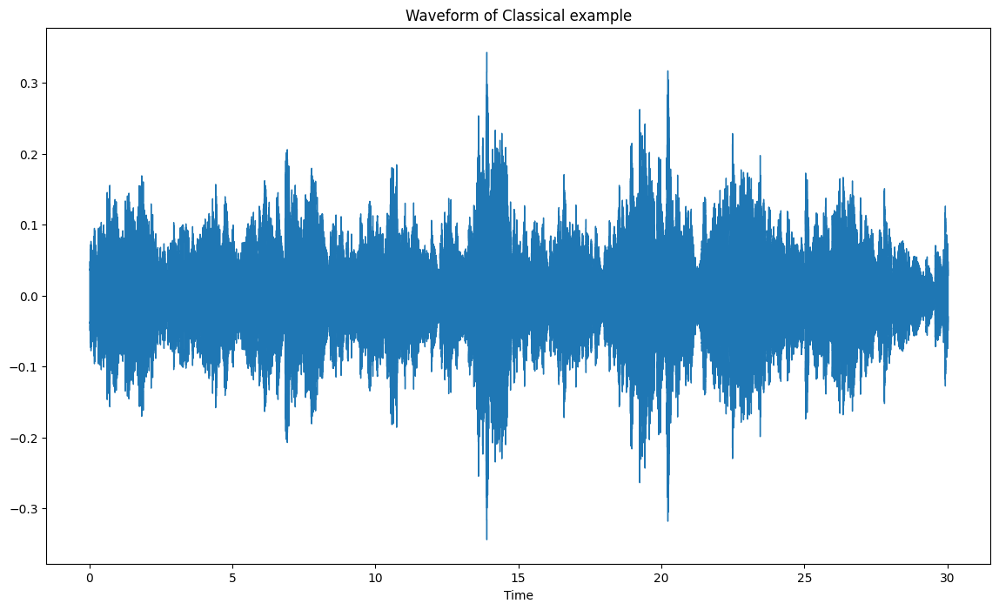

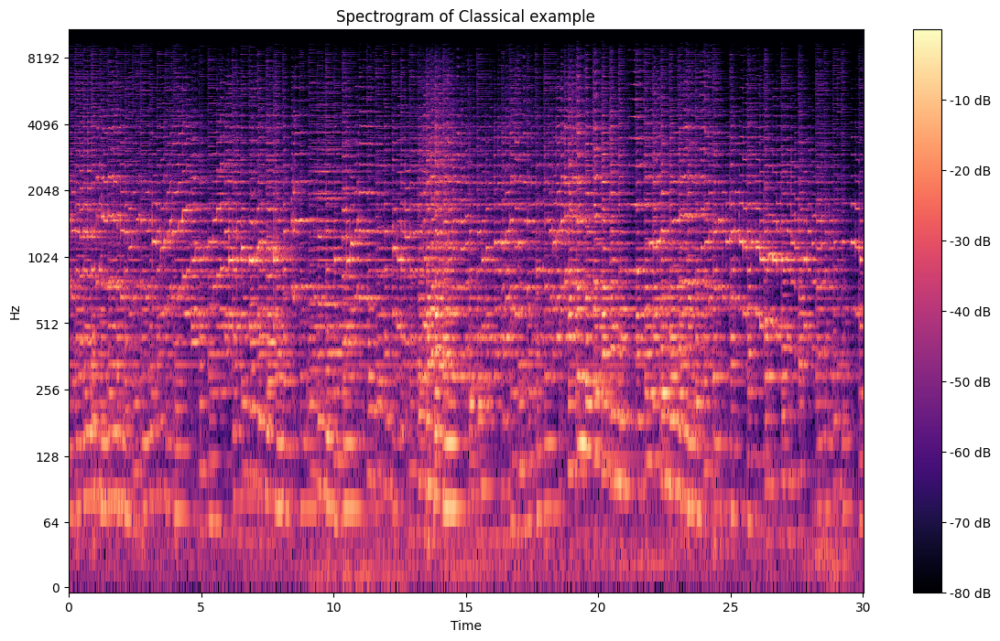

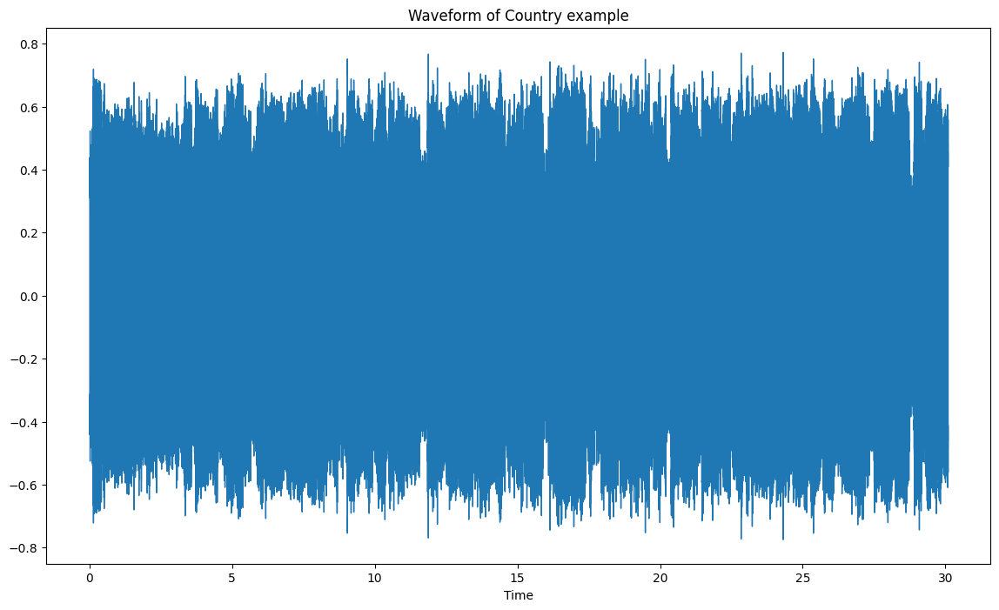

...

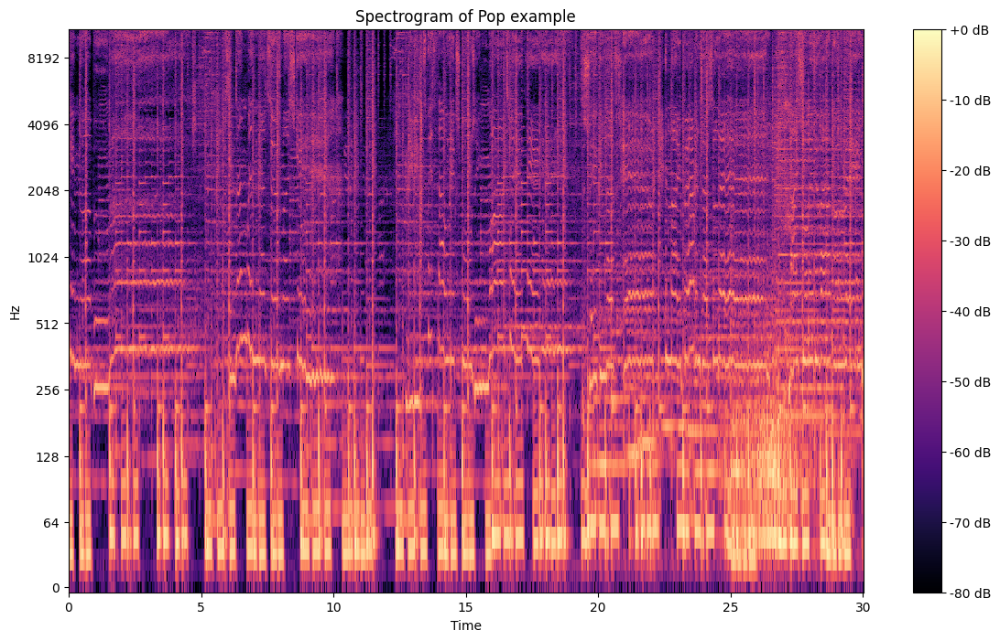

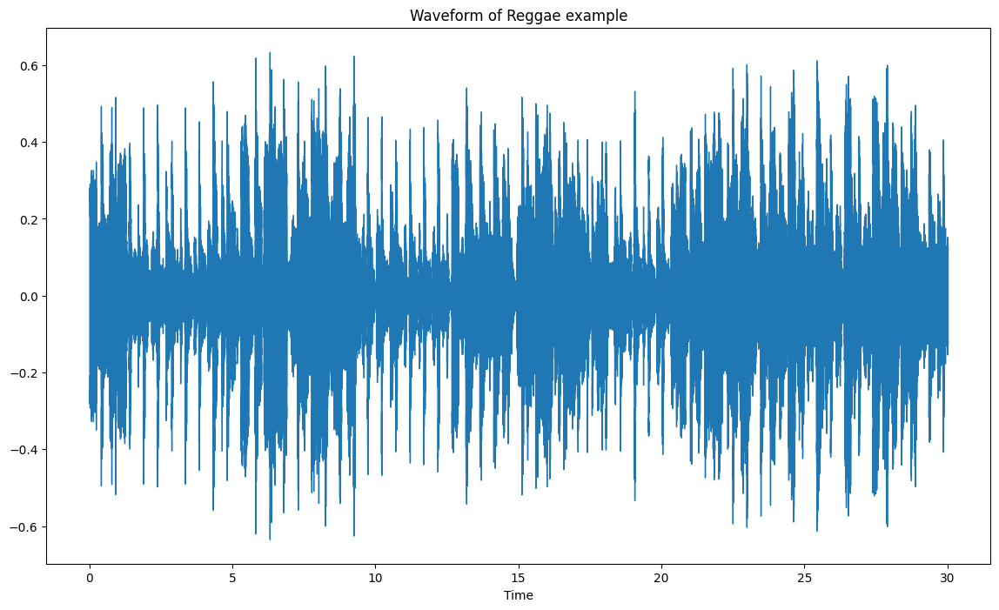

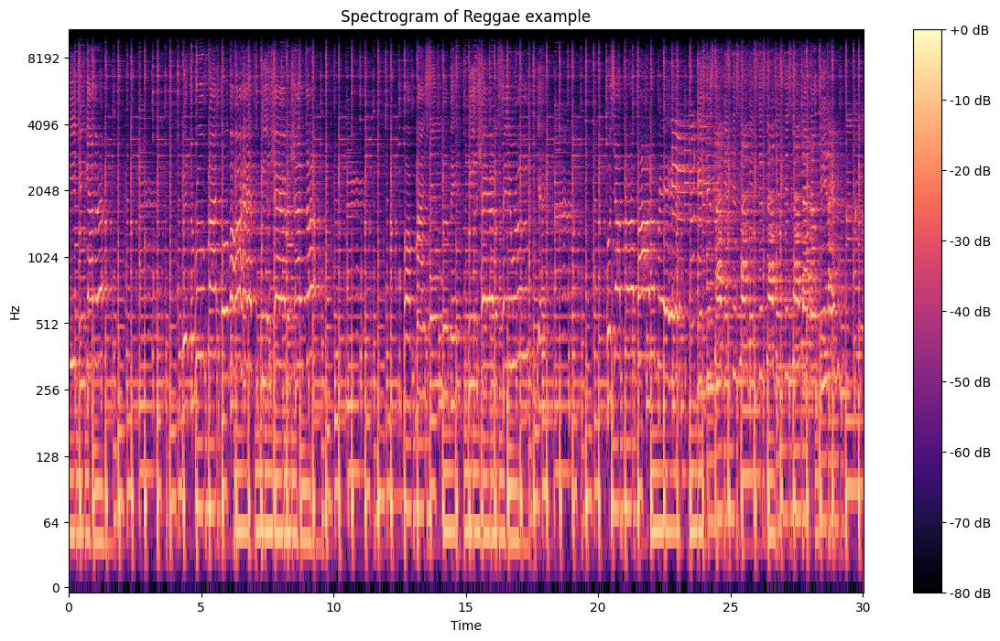

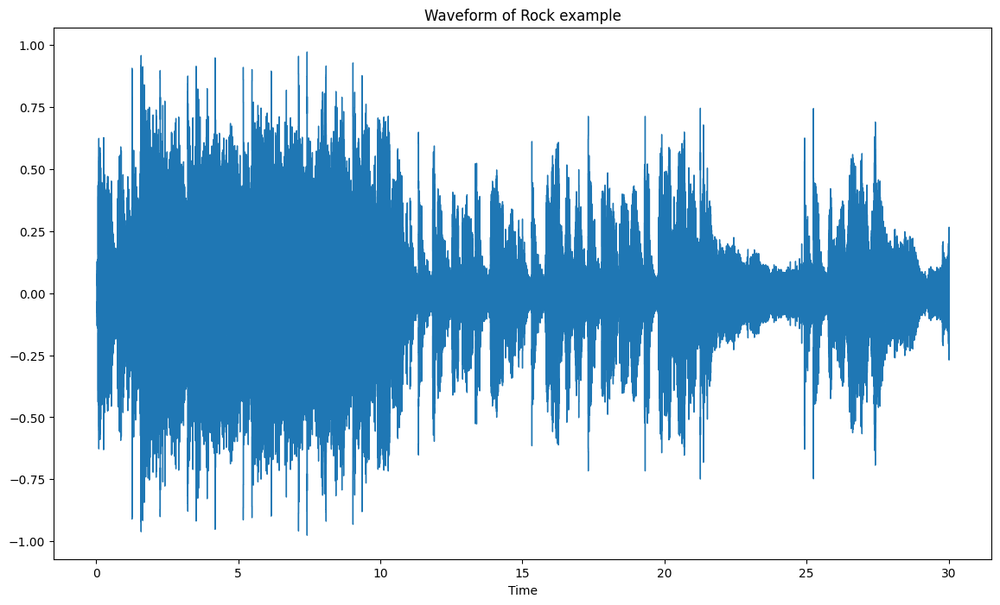

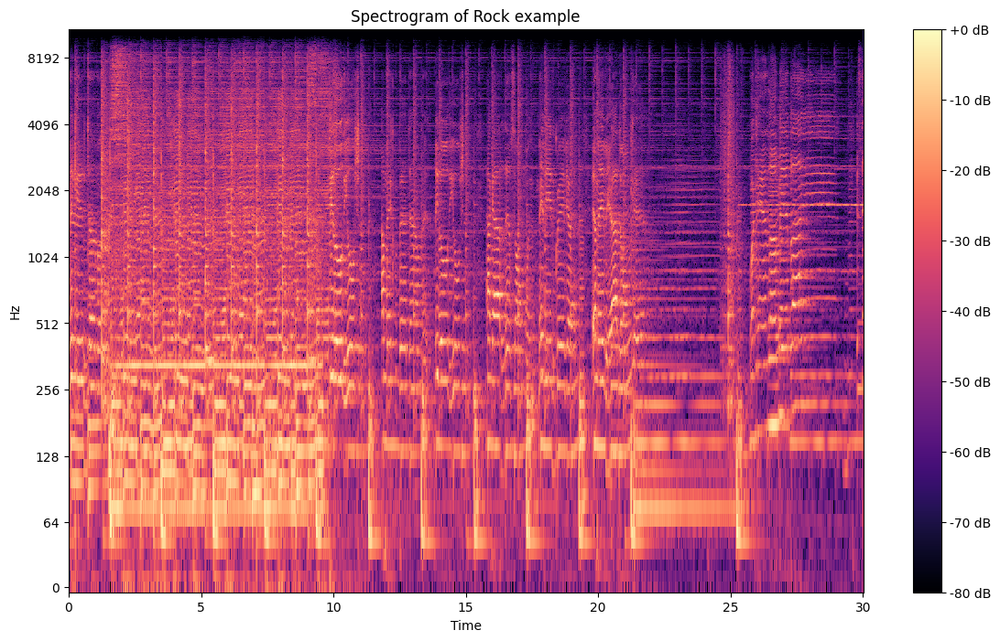

In [58]:
import librosa.display

for genre in genres:
    example_file = os.path.join(data_dir, genre, os.listdir(os.path.join(data_dir, genre))[0])
    y, sr = librosa.load(example_file)
    
    plt.figure(figsize=(14, 8))
    librosa.display.waveshow(y, sr=sr)
    plt.title(f'Waveform of {genre.capitalize()} example')
    plt.show()
    
    plt.figure(figsize=(14, 8))
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram of {genre.capitalize()} example')
    plt.show()

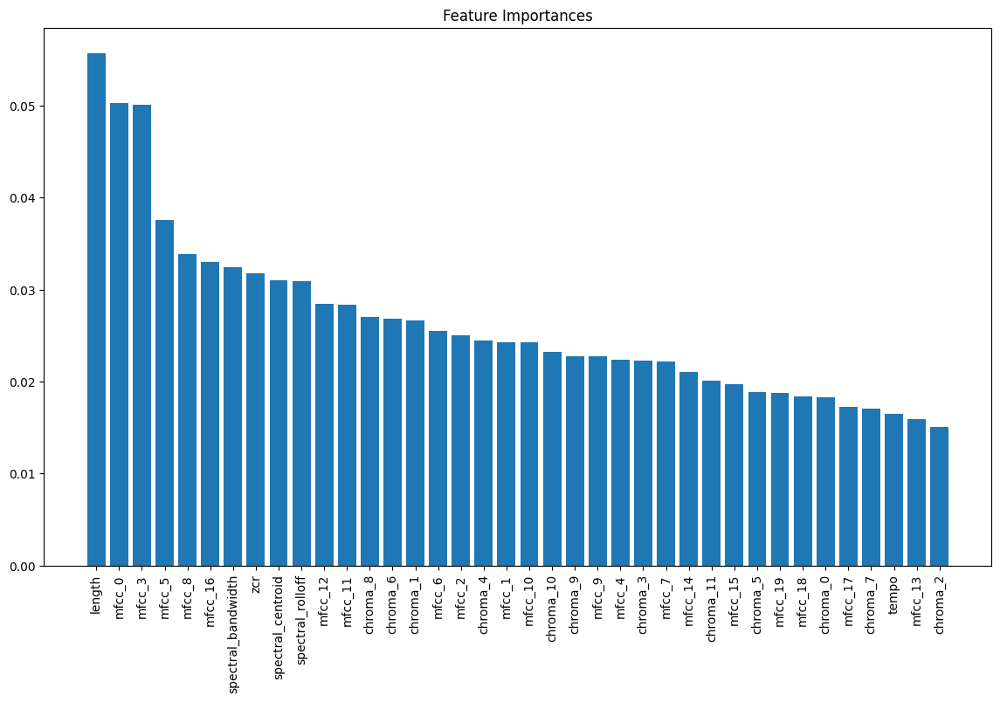

In [59]:
from sklearn.ensemble import RandomForestClassifier
importances = RandomForestClassifier().fit(features_scaled, df['genre']).feature_importances_
indices = np.argsort(importances)[::-1]
feature_names = features_df.drop(columns=['genre']).columns

plt.figure(figsize=(14, 8))
plt.title('Feature Importances')
plt.bar(range(len(importances)), importances[indices], align='center')
plt.xticks(range(len(importances)), [feature_names[i] for i in indices], rotation=90)
plt.show()

               Feature  Importance
0             tsne_one    0.067547
1               length    0.055560
2               mfcc_0    0.042427
3             tsne_two    0.040808
4               mfcc_3    0.040120
5              pca_one    0.037236
6   spectral_bandwidth    0.031208
7              pca_two    0.031092
8     spectral_rolloff    0.027497
9               mfcc_5    0.026973
10             mfcc_16    0.025427
11              mfcc_8    0.025248
12                 zcr    0.021557
13              mfcc_2    0.021362
14            chroma_6    0.021096
15   spectral_centroid    0.020761
16              mfcc_6    0.020735
17             mfcc_12    0.020352
18            chroma_4    0.019836
19              mfcc_4    0.019773
20             mfcc_11    0.019534
21            chroma_8    0.018723
22             mfcc_10    0.018691
23            chroma_3    0.018559
24            chroma_1    0.018375
25           chroma_11    0.018366
26            chroma_9    0.018265
27             mfcc_

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


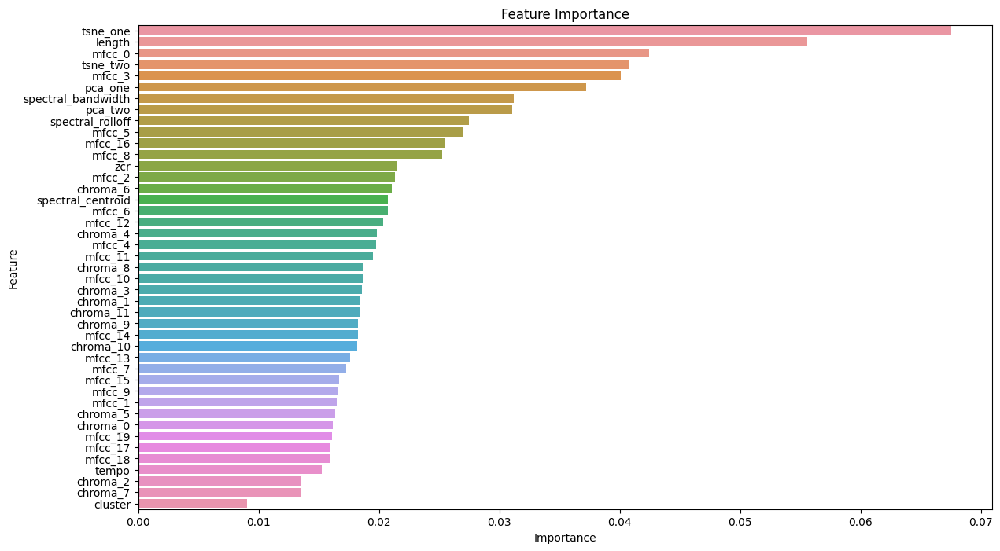

In [66]:
from sklearn.ensemble import RandomForestClassifier

X = features_df.drop(columns=['genre'])
y = features_df['genre']
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)

importances = rf.feature_importances_
feature_names = X.columns
indices = np.argsort(importances)[::-1]

feature_importance_df = pd.DataFrame({
    'Feature': feature_names[indices],
    'Importance': importances[indices]
})
print(feature_importance_df)

plt.figure(figsize=(14, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.show()

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

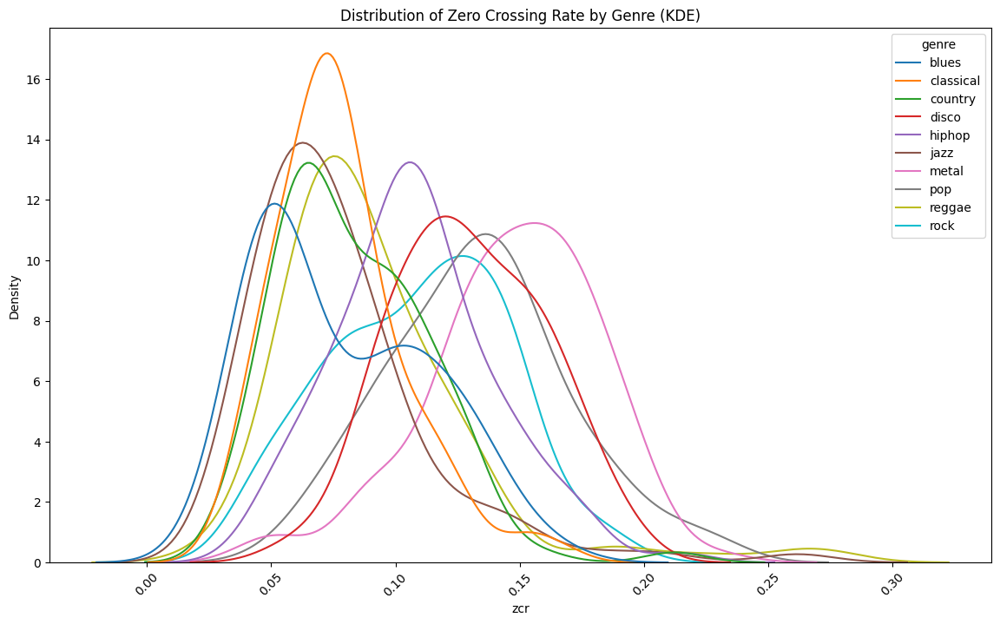

c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\james\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is depr

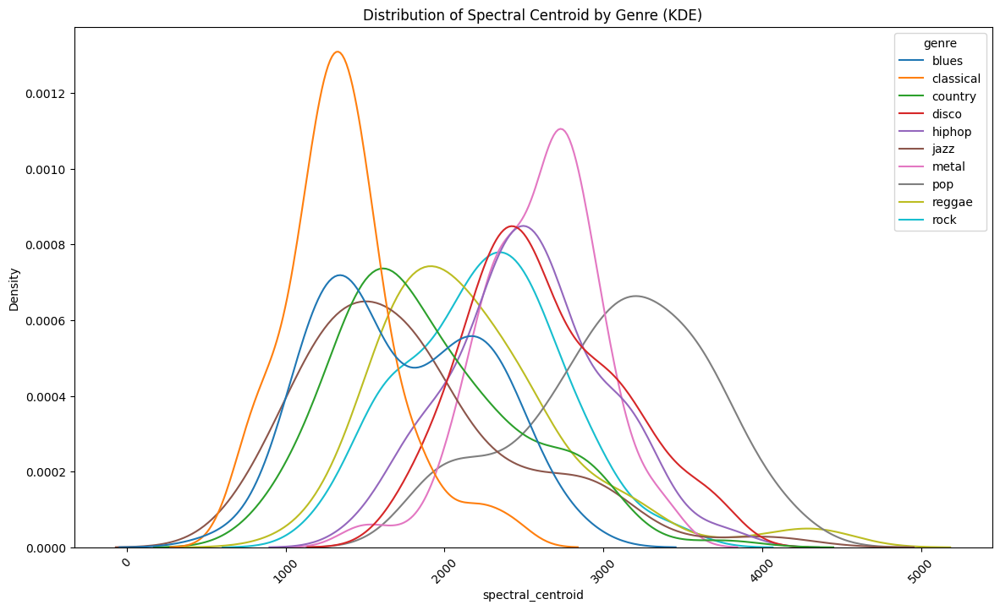

In [67]:
plt.figure(figsize=(14, 8))
sns.kdeplot(data=features_df, x='zcr', hue='genre', common_norm=False)
plt.title('Distribution of Zero Crossing Rate by Genre (KDE)')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(14, 8))
sns.kdeplot(data=features_df, x='spectral_centroid', hue='genre', common_norm=False)
plt.title('Distribution of Spectral Centroid by Genre (KDE)')
plt.xticks(rotation=45)
plt.show()

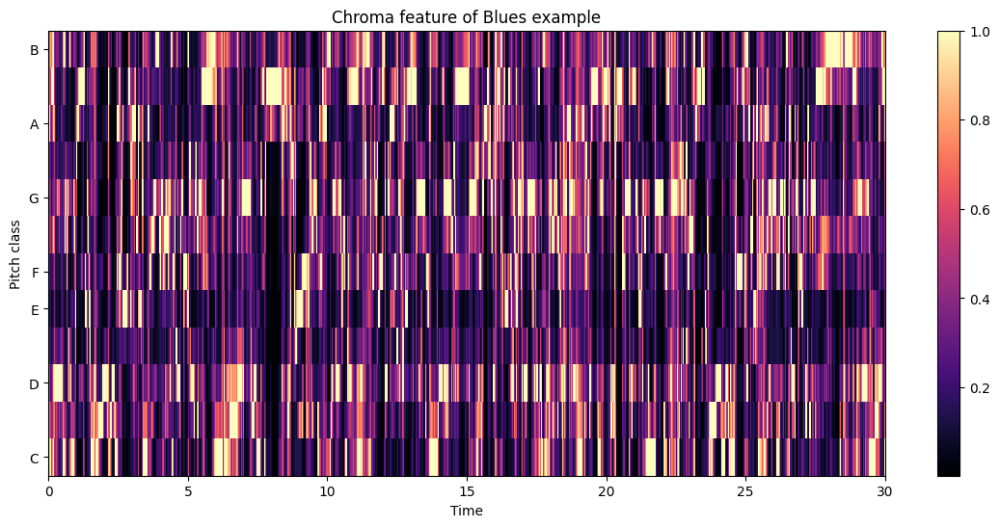

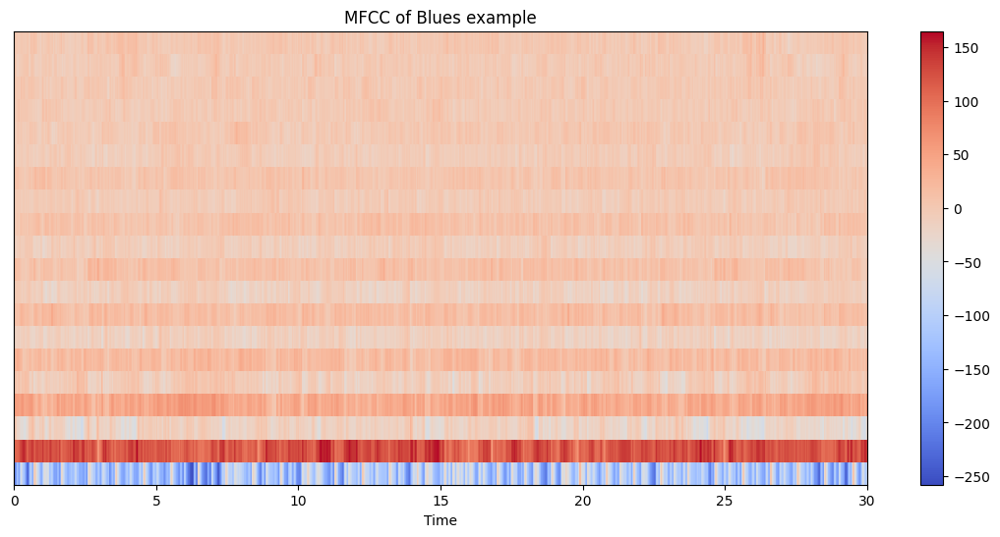

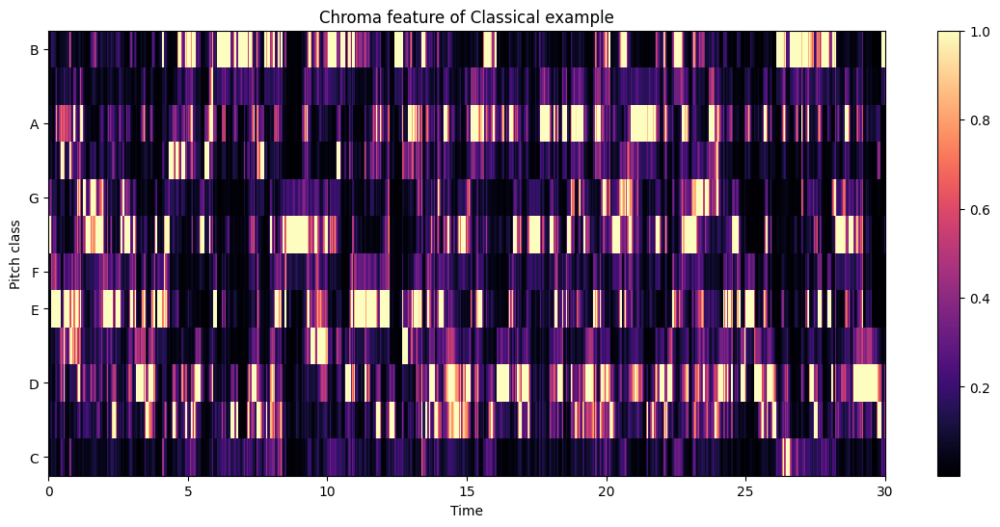

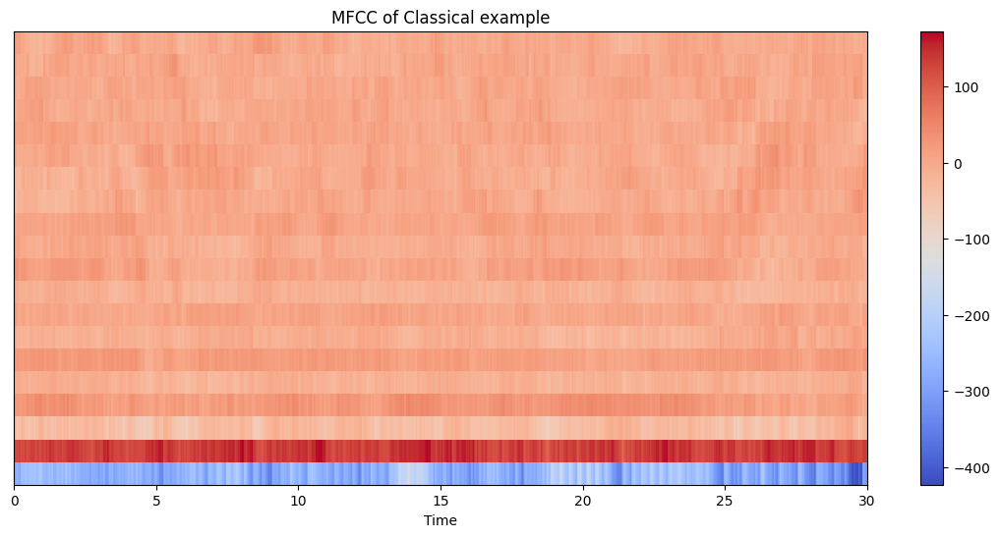

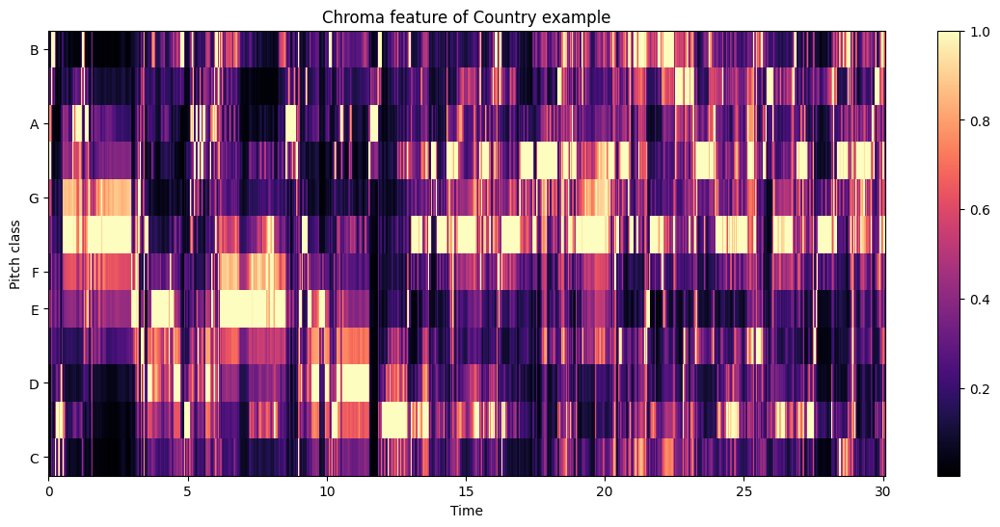

...

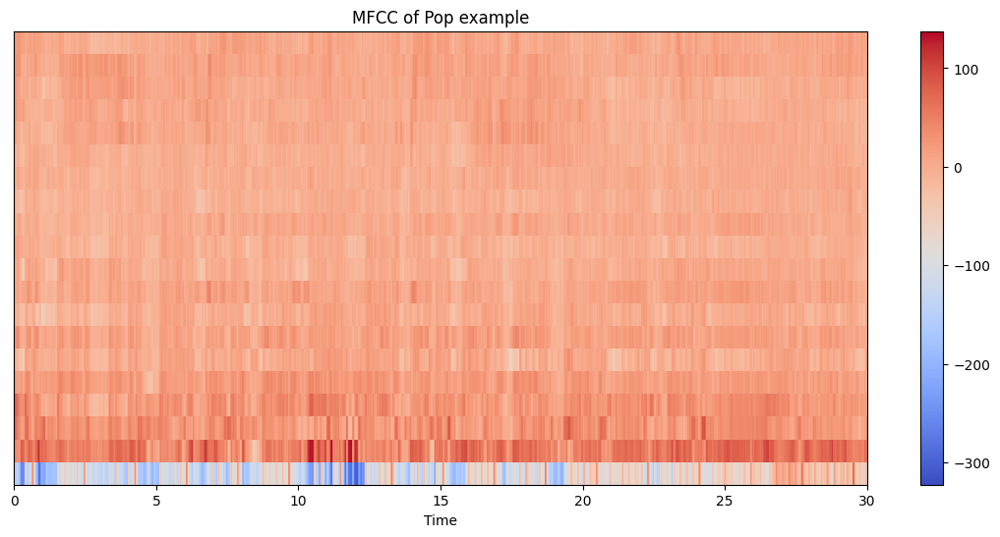

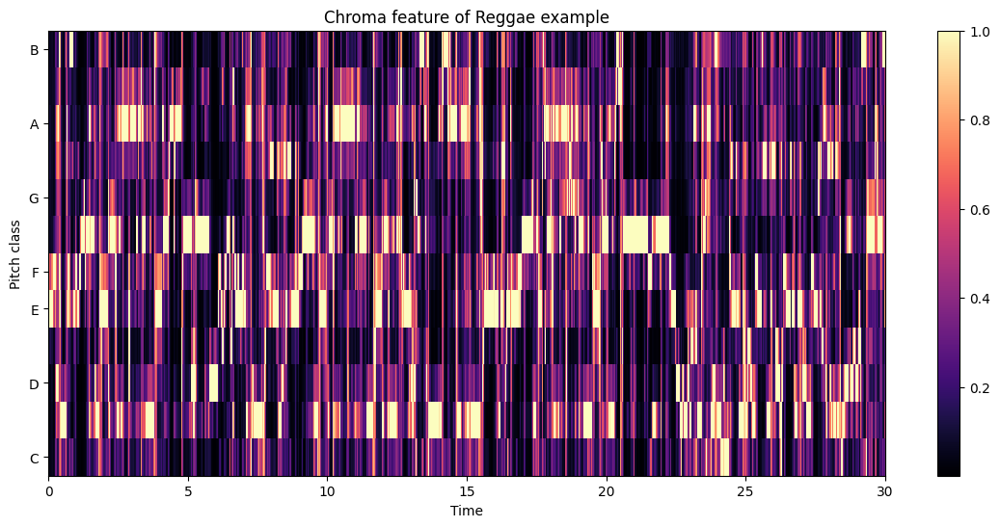

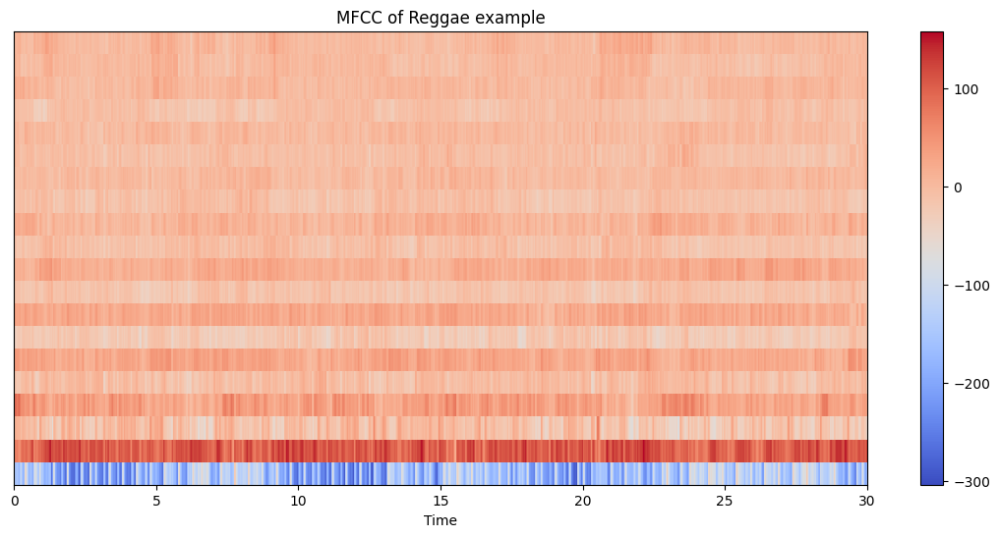

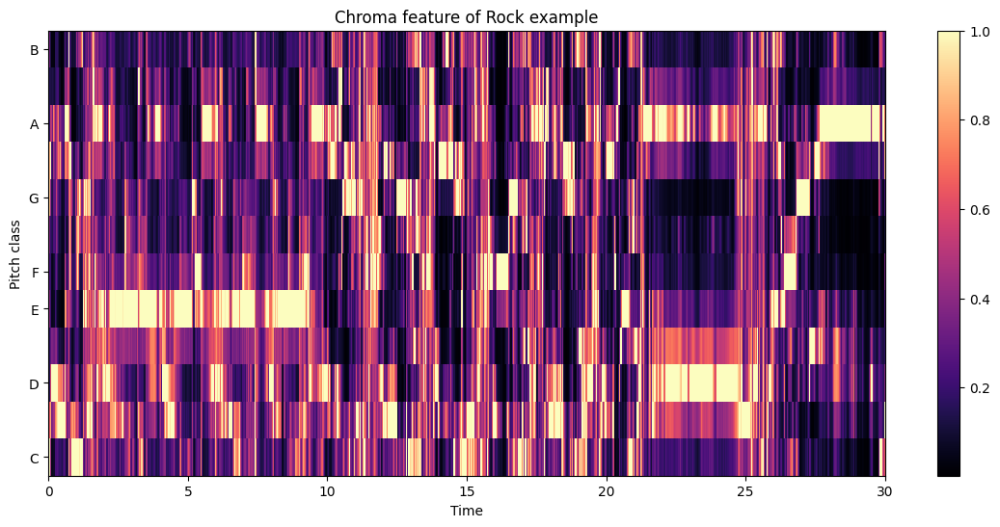

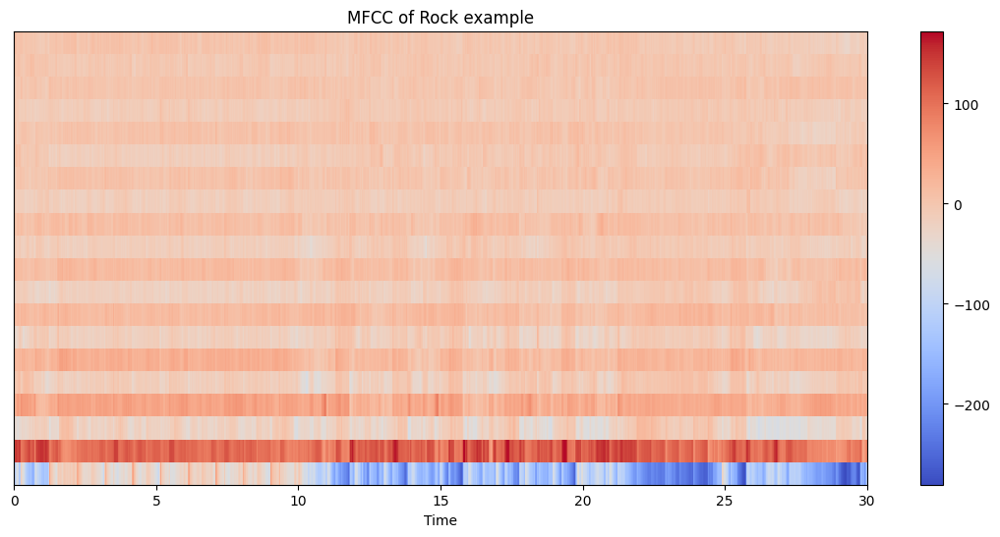

In [72]:
import librosa.display

for genre in genres:
    example_file = os.path.join(data_dir, genre, os.listdir(os.path.join(data_dir, genre))[0])
    y, sr = librosa.load(example_file)
    
    plt.figure(figsize=(14, 6))
    chroma = librosa.feature.chroma_stft(y=y, sr=sr)
    librosa.display.specshow(chroma, y_axis='chroma', x_axis='time')
    plt.colorbar()
    plt.title(f'Chroma feature of {genre.capitalize()} example')
    plt.show()

    plt.figure(figsize=(14, 6))
    mfccs = librosa.feature.mfcc(y=y, sr=sr)
    librosa.display.specshow(mfccs, x_axis='time')
    plt.colorbar()
    plt.title(f'MFCC of {genre.capitalize()} example')
    plt.show()
